In [1]:
import os
from PIL import Image

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
sns.set_theme(style='ticks')

# Utility functions

In [3]:
# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_decode(mask_rle: str, shape=(768, 768)):
    """
    Creates a binary mask from rle string
    
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    """
    try:
        s = mask_rle.split()
    except AttributeError:
        return np.zeros(shape)
    # create 2 np arrays of start indices and lenths
    starts, lengths = (np.array(x, dtype=int) for x in (s[0::2], s[1::2]))
    starts -= 1  # subtract 1 because indexing starts from 0
    ends = starts + lengths  # compute idx of last pixel using lengths
    # create flattened array of 0's to to match the indices
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1  # mask range
    return img.reshape(shape).T  # Needed to align to RLE direction


def visualize_samples(df, count=20, title=None):
    if not title:
        title = f'{count} random samples from the dataset'
    
    plt.figure(figsize=(20, 20))
    plt.suptitle(title, fontsize=25)
    
    num_rows = count // 5
    image_ids = df.ImageId.sample(count)
    
    for i, img_id in enumerate(image_ids):
        sample = df.loc[df.ImageId == img_id]
        filename = sample.ImageId.iloc[0]
        img = Image.open(os.path.join('../data/raw/train_v2', filename))
        img_shape = img.size
        mask_img = np.zeros(img_shape)
        for rle_str in sample.EncodedPixels:
            mask_img += rle_decode(rle_str, img_shape)
        
        plt.subplot(num_rows, 5, i + 1)
        plt.imshow(img)
        plt.imshow(mask_img, alpha=0.4)
        plt.title(f'Ship(s): {sample.ShipCount.iloc[0]}', fontsize=18)
        plt.axis('off')
        plt.grid(False)
    plt.tight_layout()

# EDA and Visualization

Firstly, let's look at the distribution of our data. It is important to know the proportion of images with and without ships.

In [4]:
df = pd.read_csv('../data/raw/train_ship_segmentations_v2.csv')
print(f'Training dataset contains {len(df)} samples')

Training dataset contains 231723 samples


In [5]:
with_ships = df[~df.EncodedPixels.isna()].ImageId.unique()
without_ships = df[df.EncodedPixels.isna()].ImageId.unique()

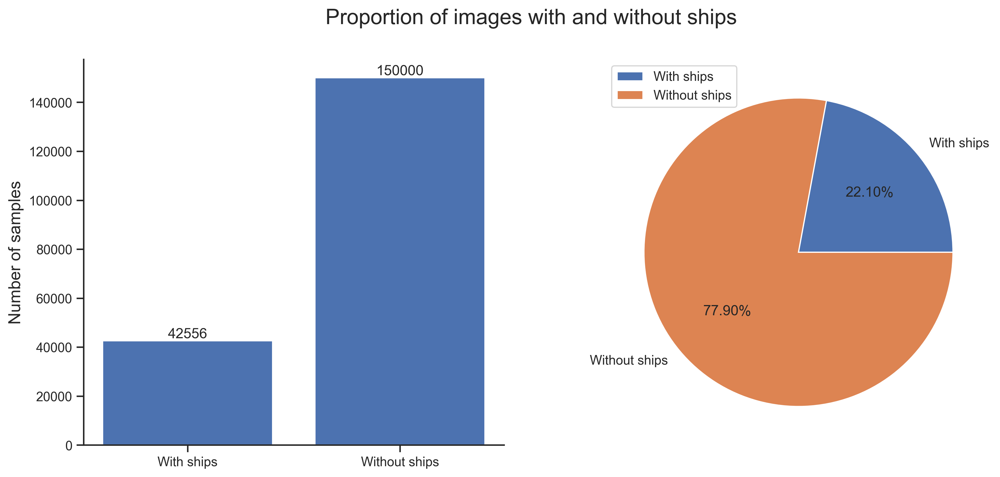

In [6]:
plotting_data = (len(with_ships), len(without_ships))

fig, ax = plt.subplots(1, 2, figsize=(14, 6), dpi=300)
fig.suptitle('Proportion of images with and without ships', fontsize=18)
container = ax[0].bar(('With ships', 'Without ships'), plotting_data)
ax[0].bar_label(container)
ax[0].set_ylabel('Number of samples', fontsize=14)

ax[1].pie(plotting_data, labels=('With ships', 'Without ships'), autopct='%.2f%%')
ax[1].legend()
sns.despine();

As we can see, our data is heavily imbalanced. Maybe we will need to use some weighted loss to handle this situation.

Now let's take a closer look and count how many ships we can find on the picture

In [7]:
# add a new column with count of ships on individual picture
df['ShipCount'] = df.groupby('ImageId')['ImageId'].transform('count')

# at this point pictures where we don't have ships (EncodedPixels == NaN) are also have ShipCount == 1
# the line below fixes it
df.loc[df['EncodedPixels'].isnull(), 'ShipCount'] = 0

In [8]:
df.head()

,ImageId,EncodedPixels,ShipCount
0,00003e153.jpg,NaN,0
1,0001124c7.jpg,NaN,0
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,5
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,5


We already know that there are 150k of images without and 42.5k images with ships. Let's look in details on the distribution of ships on images with positive count.

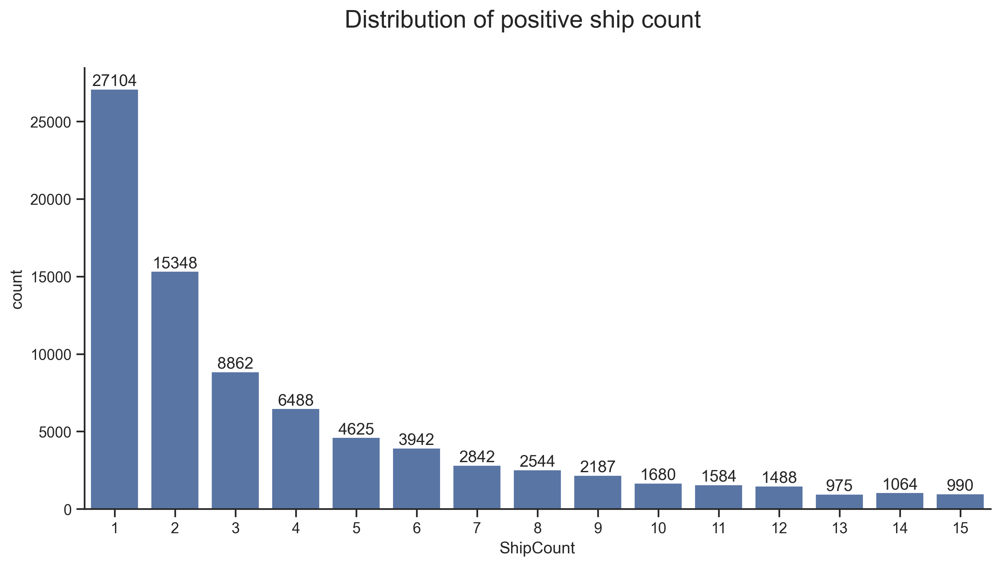

In [9]:
# plot the same distribution except 0 count
fig = plt.figure(figsize=(12, 6), dpi=300)
fig.suptitle('Distribution of positive ship count', fontsize=18)
ax = sns.countplot(x='ShipCount', data=df.loc[df['ShipCount'] > 0], color='b')
ax.bar_label(ax.containers[0])
sns.despine()

Now, when we know what to expect, let's finally check out the actual images

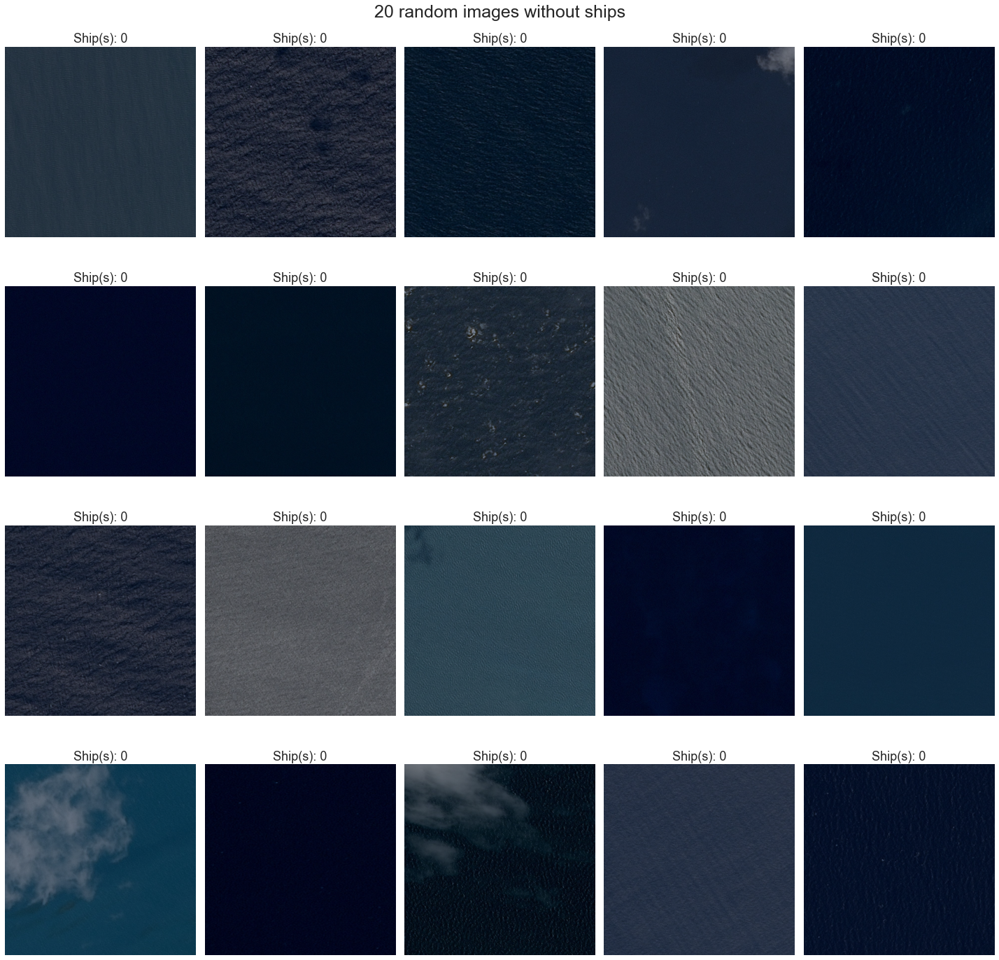

In [10]:
# plot images without ships
no_ships = df.loc[df.EncodedPixels.isna()]
visualize_samples(no_ships, title='20 random images without ships')

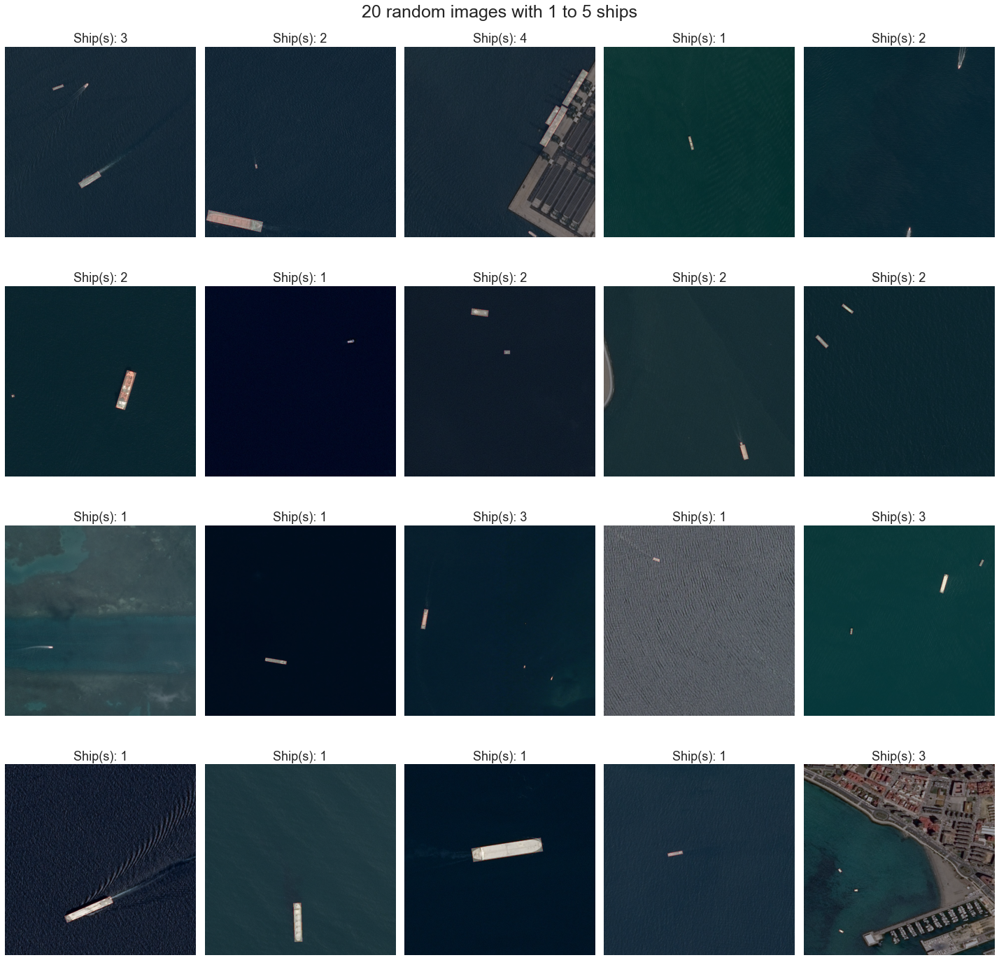

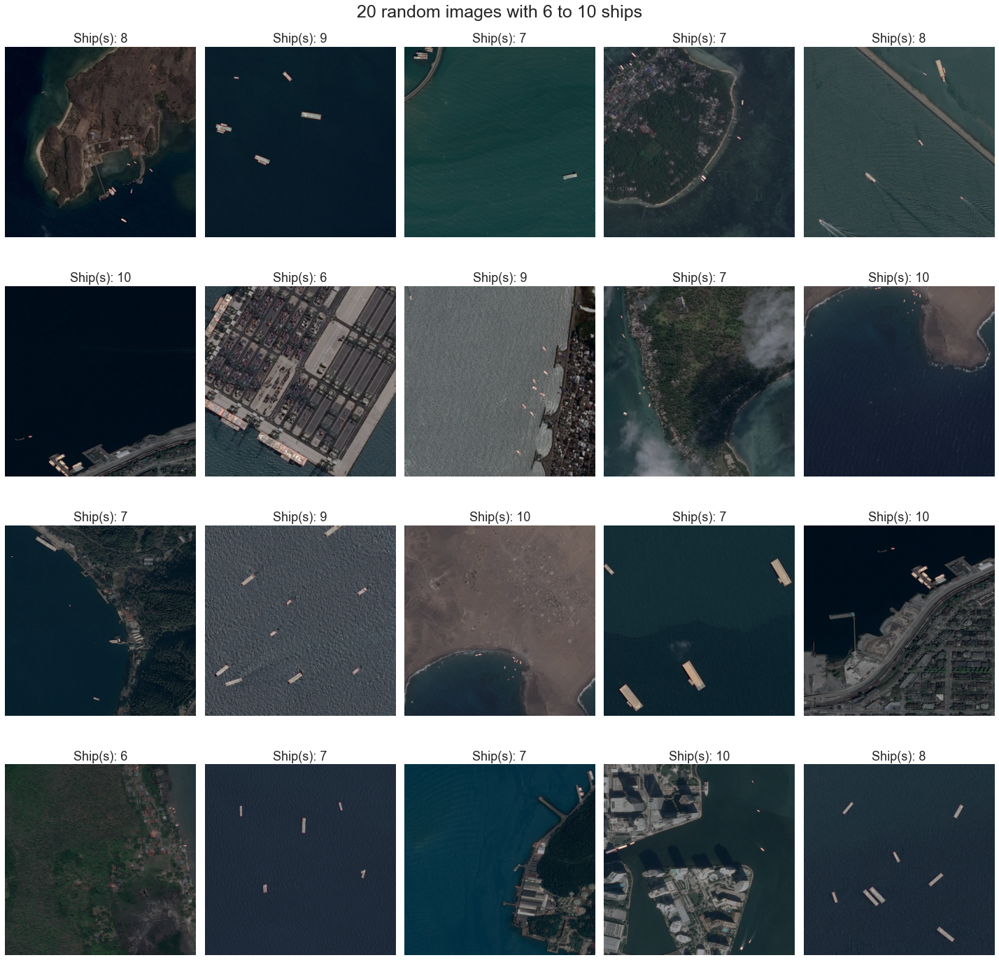

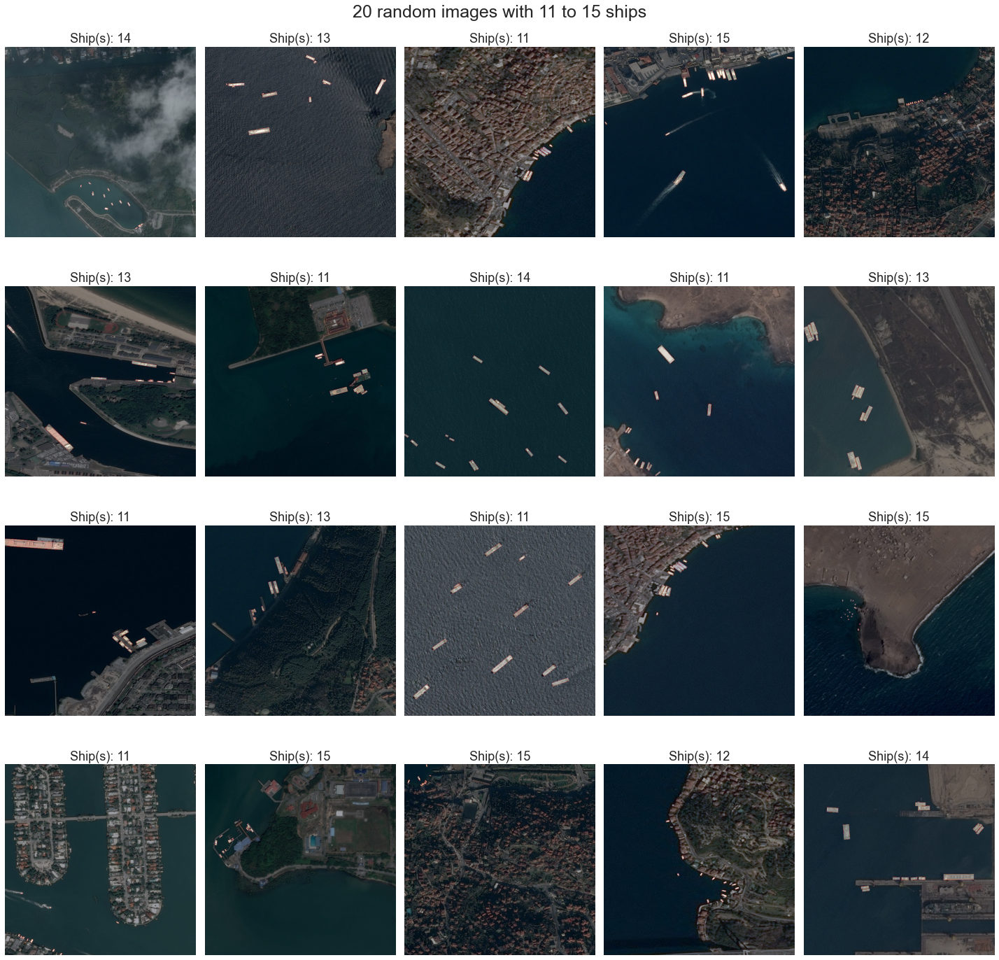

In [11]:
for i in range(1, 16, 5):
    ships_df = df.loc[df.ShipCount.between(i, i + 5, 'left')]
    visualize_samples(ships_df, title=f'20 random images with {i} to {i + 4} ships')